In [60]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pickle
import os
import cv2

In [61]:
class AutoDronestoc(gym.Env):
    def __init__(self):
        super(AutoDronestoc, self).__init__()
        self.grid_s = 6
        self.up, self.down, self.left, self.right, self.pick, self.drop = 0, 1, 2, 3, 4, 5
        self.action_space = spaces.Discrete(6)

        self.observation_space = spaces.Tuple((spaces.Discrete(self.grid_s), spaces.Discrete(self.grid_s), spaces.Discrete(2)))
        self.warehouse_loc = (0, 0)
        self.delivery_loc = (5, 5)
        self.nofly = {(2, 2), (2, 3), (3, 2), (3, 3)}

        self.reset()

    def reset(self):
        super().reset()
        while True:
            self.curr_pos = (
                random.randint(0, self.grid_s-1),
                random.randint(0, self.grid_s-1)
            )
            if self.curr_pos not in self.nofly:
                break
        self.package = False
        return (self.curr_pos[0], self.curr_pos[1], int(self.package)), {}
    
    def step(self, action):
        ep_end = False
        reward = -1
        x, y = self.curr_pos
        
        if action <= 3:  
            if random.random() < 0.1:
                action = random.randint(0, 3)
                
            if action == self.up:  
                new_pos = (x, min(y + 1, self.grid_s - 1))
            elif action == self.down:  
                new_pos = (x, max(y - 1, 0))
            elif action == self.left:  
                new_pos = (max(x - 1, 0), y)
            elif action == self.right: 
                new_pos = (min(x + 1, self.grid_s - 1), y)
                
            if new_pos in self.nofly:
                reward = -100
                ep_end = True
            else:
                self.curr_pos = new_pos
                
        elif action == self.pick:  
            if self.curr_pos == self.warehouse_loc and not self.package:
                self.package = True
                reward = 25
            else:
                reward = -10
                
        elif action == self.drop:  
            if self.curr_pos == self.delivery_loc and self.package:
                self.package = False
                reward = 100
                ep_end = True
            else:
                reward = -10
                
        return (self.curr_pos[0], self.curr_pos[1], int(self.package)), reward, ep_end, False, {}
    
    def render(self, mode='human', plot=False):
        fig, ax = plt.subplots()

        def plot_image(plot_pos):
            drone = False
            droneAndpackage = False
            warehouse = False
            delivery_point = False
            noFlyZ = False
            cld = False

            fixed_size = (60, 50)  # Set the fixed size for all images
            def preprocessImg(image_path):
                normalized_path = os.path.normpath(image_path)
                if not os.path.exists(normalized_path):
                    print(f"Error: Image not found at {normalized_path}")
                    return None
                img = plt.imread(normalized_path)
                resized_img = cv2.resize(img, fixed_size, interpolation=cv2.INTER_AREA)
                return resized_img

            # Check conditions for each type of cell
            plot_pos = np.array(plot_pos)
            if np.array_equal(plot_pos, self.curr_pos) and not self.package:
                drone = True
            elif np.array_equal(plot_pos, self.curr_pos) and self.package:
                droneAndpackage = True
            elif np.array_equal(plot_pos, self.warehouse_loc):
                warehouse = True
            elif np.array_equal(plot_pos, self.delivery_loc):
                delivery_point = True
            elif tuple(plot_pos) in self.nofly:
                noFlyZ = True
            else:
                cld = True

            if drone and all(not item for item in [droneAndpackage, warehouse, delivery_point, noFlyZ, cld]):
                drone_img = preprocessImg('./images/drone.jpg')
                if drone_img is not None:
                    drone_box = AnnotationBbox(OffsetImage(drone_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(drone_box)

            elif droneAndpackage and all(not item for item in [drone, warehouse, delivery_point, noFlyZ, cld]):
                drone_package_img = preprocessImg('./images/drone+package.jpg')
                if drone_package_img is not None:
                    drone_package_box = AnnotationBbox(OffsetImage(drone_package_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(drone_package_box)

            elif warehouse and all(not item for item in [drone, droneAndpackage, delivery_point, noFlyZ, cld]):
                warehouse_img = preprocessImg('./images/warehouse.jpg')
                if warehouse_img is not None:
                    warehouse_box = AnnotationBbox(OffsetImage(warehouse_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(warehouse_box)

            elif delivery_point and all(not item for item in [drone, droneAndpackage, warehouse, noFlyZ, cld]):
                delivery_img = preprocessImg('./images/deliveryHouse.jpg')
                if delivery_img is not None:
                    delivery_box = AnnotationBbox(OffsetImage(delivery_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(delivery_box)

            elif noFlyZ and all(not item for item in [drone, droneAndpackage, warehouse, delivery_point, cld]):
                nofly_img = preprocessImg('./images/noflyzone.jpg')
                if nofly_img is not None:
                    nofly_box = AnnotationBbox(OffsetImage(nofly_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False) 
                    ax.add_artist(nofly_box)

            elif cld and all(not item for item in [drone, droneAndpackage, warehouse, delivery_point, noFlyZ]):
                cld_img = preprocessImg('./images/clouds.jpg')
                if cld_img is not None:
                    cld_box = AnnotationBbox(OffsetImage(cld_img, zoom=1),
                                        np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(cld_box)
        mapping = {}
        for j in range(self.grid_s * self.grid_s):
            mapping[j] = np.array([j % self.grid_s, int(np.floor(j / self.grid_s))])

        for position in mapping:
            plot_image(mapping[position])

        plt.xticks(range(self.grid_s+1))
        plt.yticks(range(self.grid_s+1))
        plt.grid()
        plt.title('Drone Environment')

        if plot:
            plt.show()
        else:
            fig.canvas.draw()
            img = np.array(fig.canvas.renderer.buffer_rgba())[:, :, :3]
            width = height = 100
            preprocessed_image = cv2.resize(img, (width, height), interpolation=cv2.INTER_AREA)
            plt.show()
            plt.pause(0.1)
            return preprocessed_image


current state is: (1, 3, 0), Action taken: 5, Reward: -10


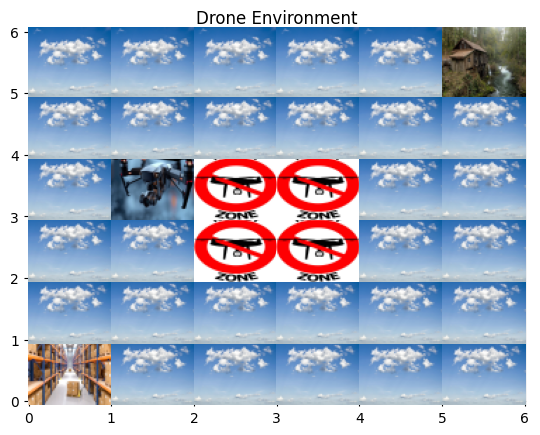

current state is: (0, 3, 0), Action taken: 2, Reward: -1


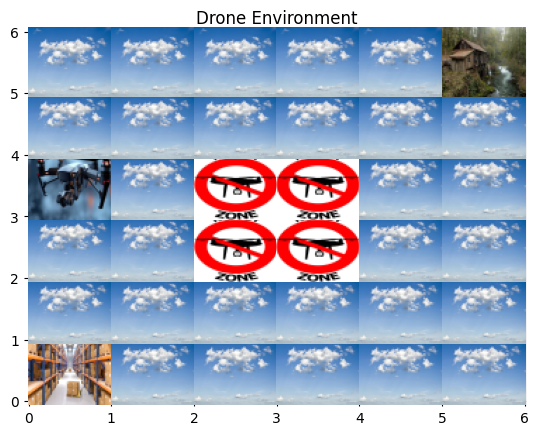

current state is: (0, 3, 0), Action taken: 2, Reward: -1


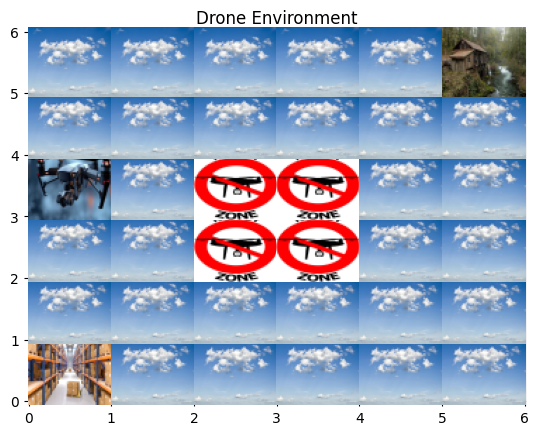

current state is: (0, 2, 0), Action taken: 1, Reward: -1


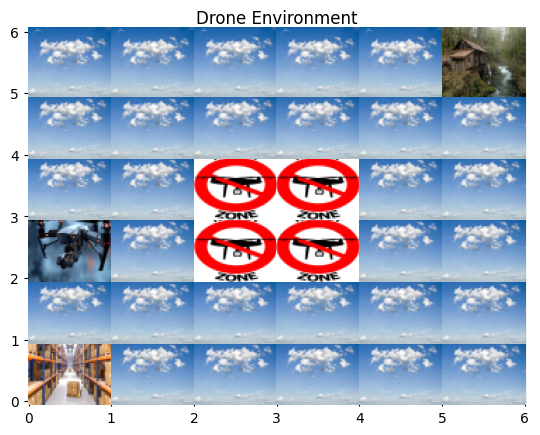

current state is: (0, 3, 0), Action taken: 3, Reward: -1


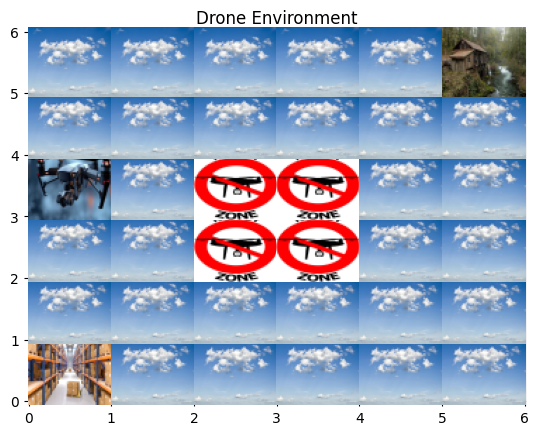

current state is: (0, 2, 0), Action taken: 1, Reward: -1


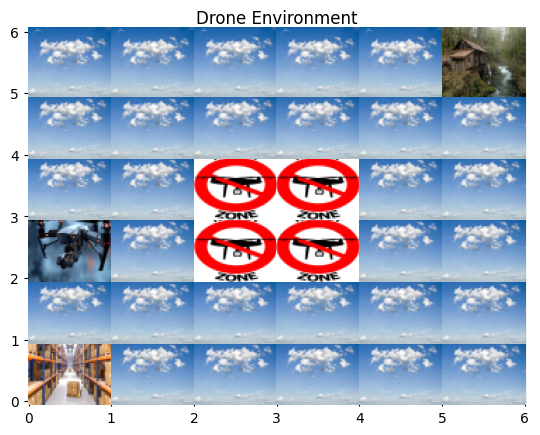

current state is: (0, 1, 0), Action taken: 1, Reward: -1


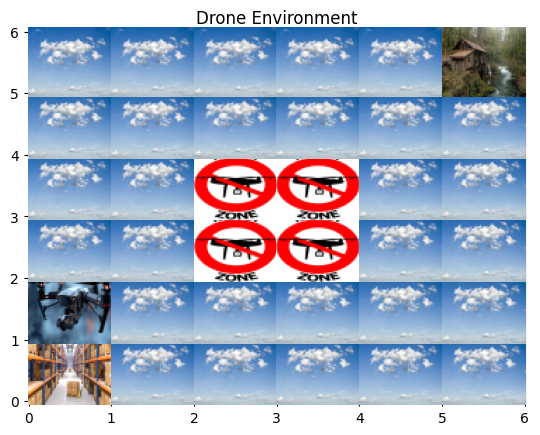

current state is: (0, 2, 0), Action taken: 0, Reward: -1


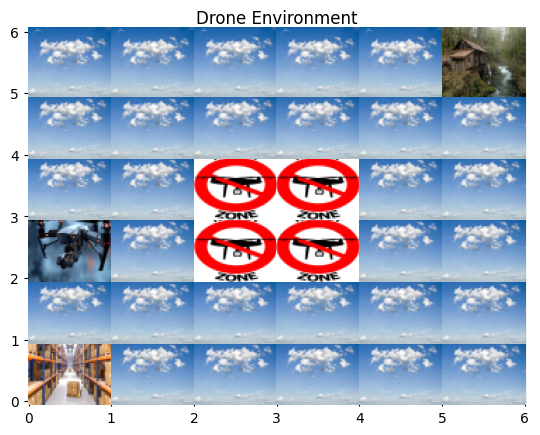

current state is: (0, 3, 0), Action taken: 0, Reward: -1


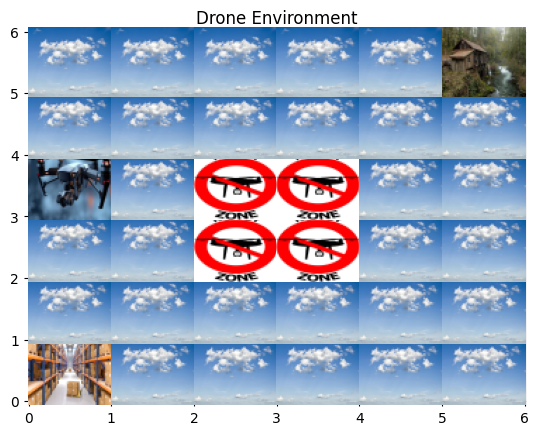

current state is: (0, 4, 0), Action taken: 0, Reward: -1


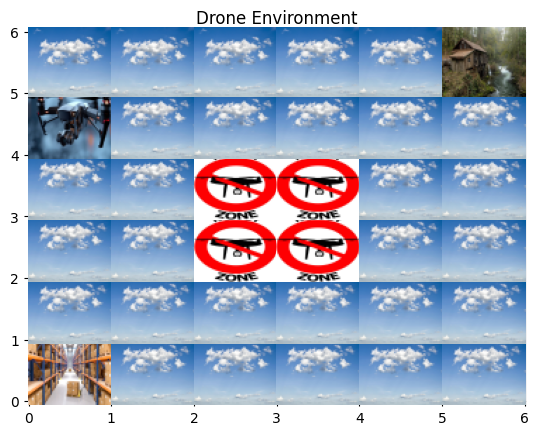

In [62]:
if __name__ == "__main__":
    env = AutoDronestoc()
    env.reset()

    for _ in range(10):
        action = env.action_space.sample()
        state, reward, ep_end, _, _ = env.step(action)
        print(f"current state is: {state}, Action taken: {action}, Reward: {reward}")
        env.render()
        if ep_end:
            break

In [63]:
class AgentQlearn:
    def __init__(self, env, lr=0.1, discount=0.99, epsilon=1.0, epsilon_decay=0.995, epsilon_min=0.01):
        self.env = env
        self.lr = lr
        self.discount = discount
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min
        self.qTable = {}
        self.initial_table = None
        
    def action_selection(self, state, training=True):
        if state not in self.qTable:
            self.qTable[state] = np.zeros(self.env.action_space.n)   
        if training and random.random() < self.epsilon:
            return self.env.action_space.sample()
        return np.argmax(self.qTable[state])
    
    def train(self, eps=1000, max_steps=100):
        self.initial_table = self.qTable.copy()
        log_Reward = []
        log_epsilon = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0        
            for step in range(max_steps):
                action = self.action_selection(state)
                next_state, reward, ep_end, _, _ = self.env.step(action)   
                if next_state not in self.qTable:
                    self.qTable[next_state] = np.zeros(self.env.action_space.n)          
                old_val = self.qTable[state][action]
                max_q = np.max(self.qTable[next_state])
                new_val = old_val + self.lr * (
                    reward + self.discount * max_q - old_val)
                self.qTable[state][action] = new_val    
                state = next_state
                total_reward += reward      
                if ep_end:
                    break       
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            log_Reward.append(total_reward)
            log_epsilon.append(self.epsilon)       
        return log_Reward, log_epsilon
    
    def test(self, eps=10, render=False):
        test_rewards = []
        ep_info = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0
            episode_states = []
            
            timestep = 1
            while True:
                action = self.action_selection(state, training=False)
                if render:
                    episode_states.append({'state': state,'action': action,'grid': self.env.render()})
                    print()
                next_state, reward, ep_end, _, _ = self.env.step(action)
                print(f"'state': {state},'action': {action}, 'reward' : {reward}")
                total_reward += reward
                state = next_state      
                if ep_end:
                    break
            test_rewards.append(total_reward)
            if render:
                ep_info.append(episode_states) 
        return test_rewards, ep_info

In [64]:
def plot_train(rewards, epsilons, title=""):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(rewards)
    plt.title(f'{title}')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    
    plt.subplot(1, 2, 2)
    plt.plot(epsilons)
    plt.title(f'{title}')
    plt.xlabel('Episode')
    plt.ylabel('Epsilon')
    
    plt.tight_layout()
    plt.savefig(f'{title.lower().replace(" ", "_")}train.png')
    plt.show()

def plot_test(rewards, title):
    plt.figure(figsize=(8, 5))
    plt.plot(rewards)
    plt.title(f'Test Results - {title}')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.savefig(f'test_{title.lower().replace(" ", "_")}.png')
    plt.show()


First base model without tuning the parameters
Initial Qtable:
{}


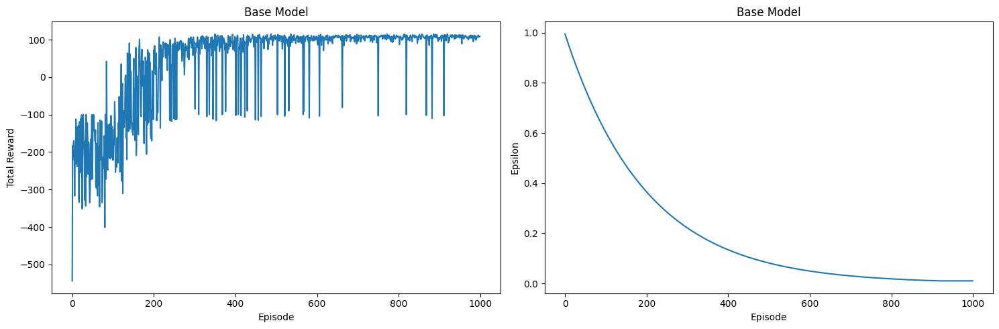


QTable after training:
{(0, 4, 0): array([-1.02905024, 89.31658823,  0.15016351,  1.24375868, -4.44786891,
       -1.81144963]), (1, 4, 0): array([ 0.41438703, 84.86083605, 10.79960011, -1.07411915, -0.40378736,
        8.77901189]), (1, 3, 0): array([ 11.05889684,   6.43898302,  92.42633947, -55.63264391,
        -1.62268759,   7.32932942]), (1, 5, 0): array([-0.18388687, 77.73604206,  4.32674531, -1.69543758,  3.73556017,
       -6.97133167]), (0, 5, 0): array([ 6.03493284, 76.46636858, -1.46085807,  7.31837995, -7.25139184,
       -6.3103919 ]), (2, 5, 0): array([-0.52675627,  0.52650356, 73.74394614, -2.49542362, -4.30335019,
       -7.3446136 ]), (3, 5, 0): array([-2.91811309, -2.53175679, 67.88636237, -2.90442081, -7.98267523,
       -8.2680317 ]), (2, 4, 0): array([-11.27619123, -38.09764119,  75.70807054,   8.06869973,
        -5.42177144,  -8.2571201 ]), (4, 5, 0): array([-3.17739191e+00, -3.15421651e+00,  4.90777408e+01, -4.34701235e-02,
       -9.54845372e+00, -8.80307811e+

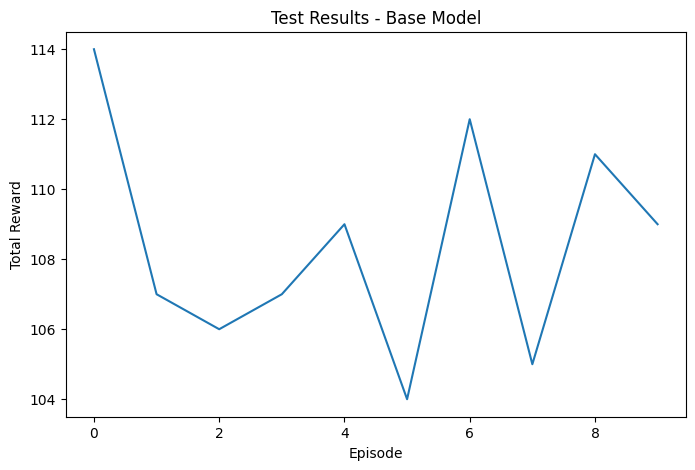

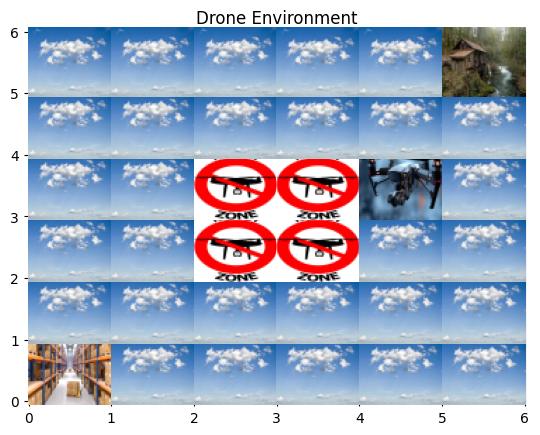


'state': (4, 3, 0),'action': 1, 'reward' : -1


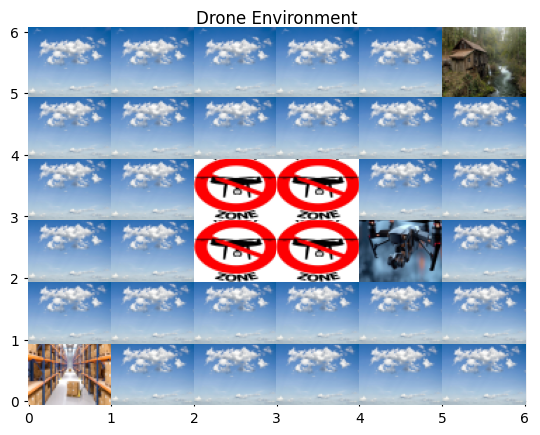


'state': (4, 2, 0),'action': 1, 'reward' : -1


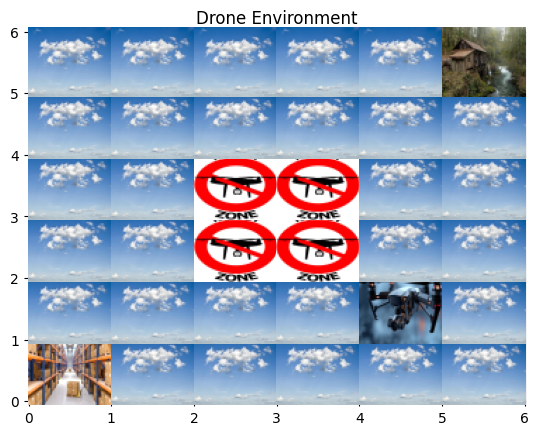


'state': (4, 1, 0),'action': 1, 'reward' : -1


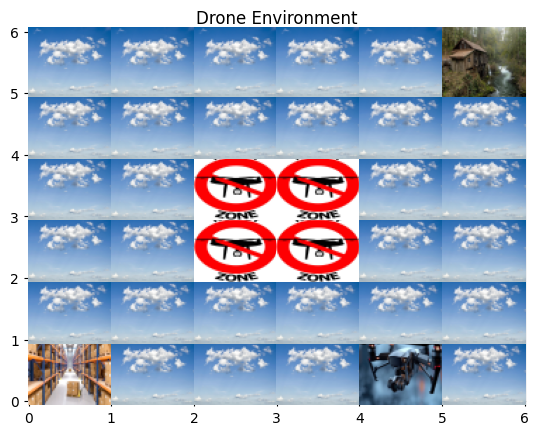


'state': (4, 0, 0),'action': 2, 'reward' : -1


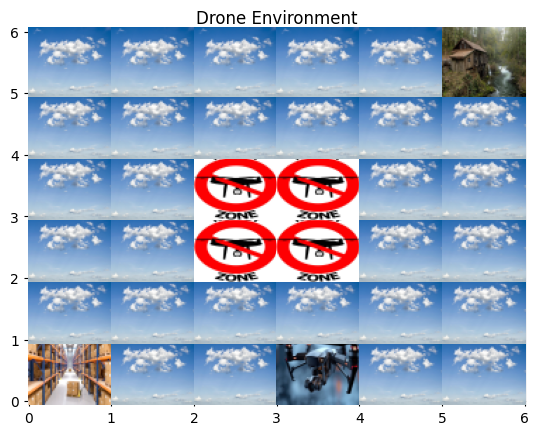


'state': (3, 0, 0),'action': 2, 'reward' : -1


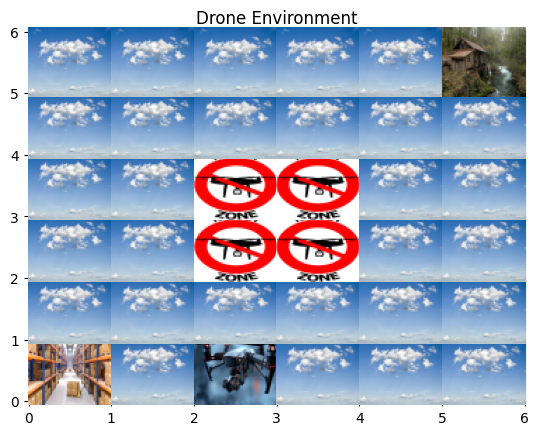


'state': (2, 0, 0),'action': 2, 'reward' : -1


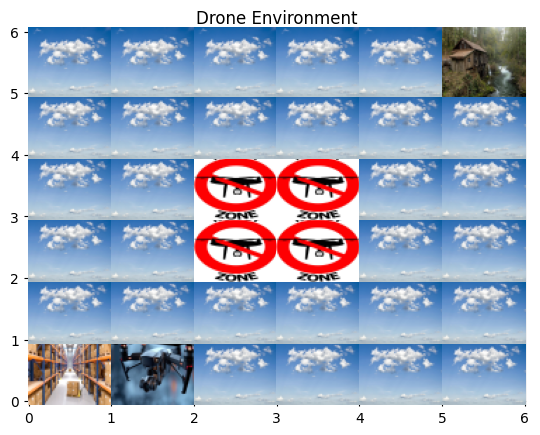


'state': (1, 0, 0),'action': 2, 'reward' : -1


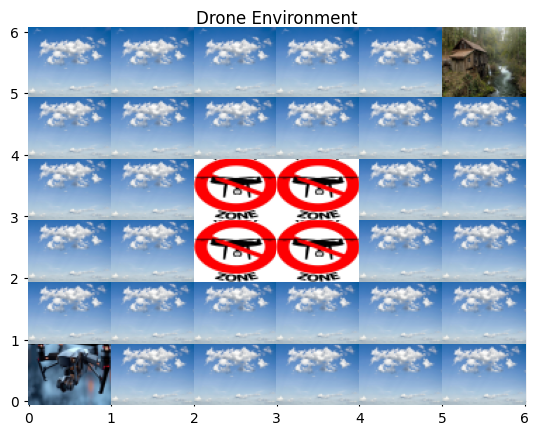


'state': (0, 0, 0),'action': 4, 'reward' : 25


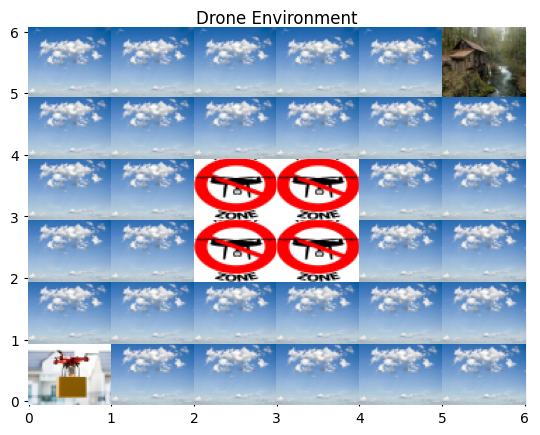


'state': (0, 0, 1),'action': 0, 'reward' : -1


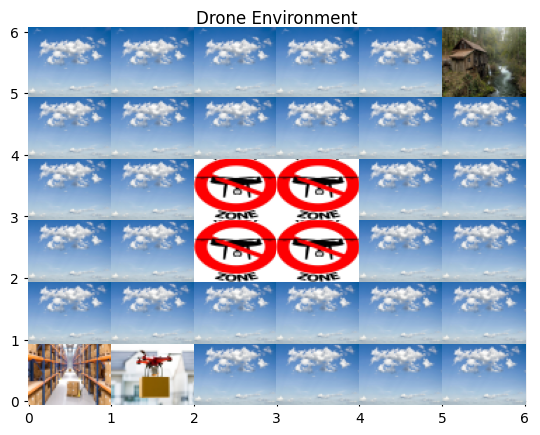


'state': (1, 0, 1),'action': 3, 'reward' : -1


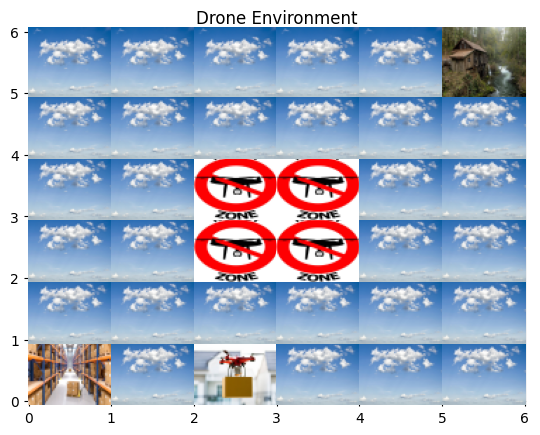


'state': (2, 0, 1),'action': 3, 'reward' : -1


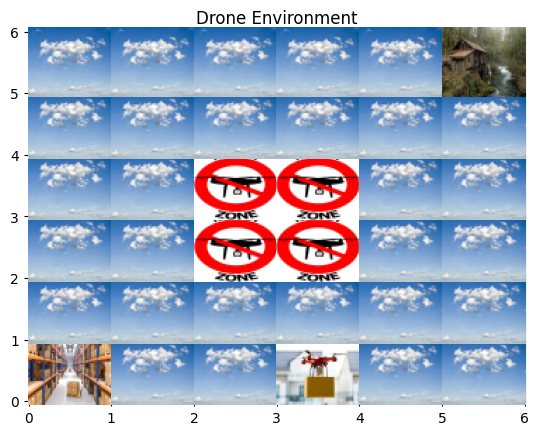


'state': (3, 0, 1),'action': 3, 'reward' : -1


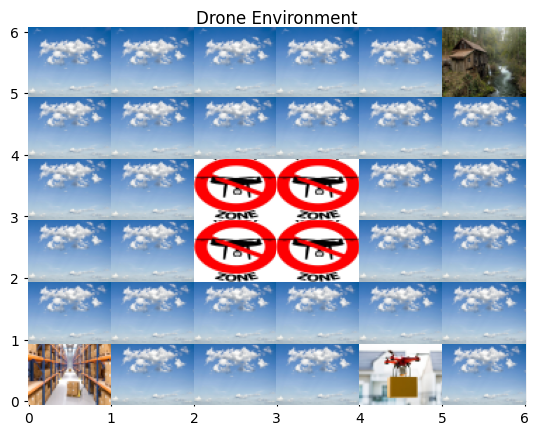


'state': (4, 0, 1),'action': 0, 'reward' : -1


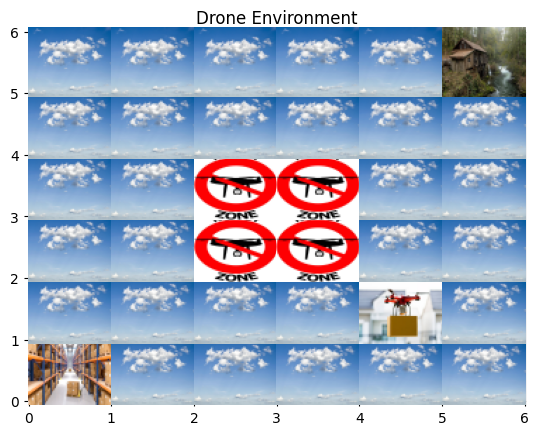


'state': (4, 1, 1),'action': 3, 'reward' : -1


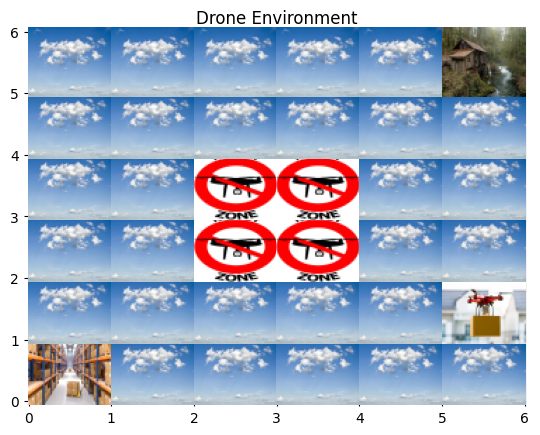


'state': (5, 1, 1),'action': 0, 'reward' : -1


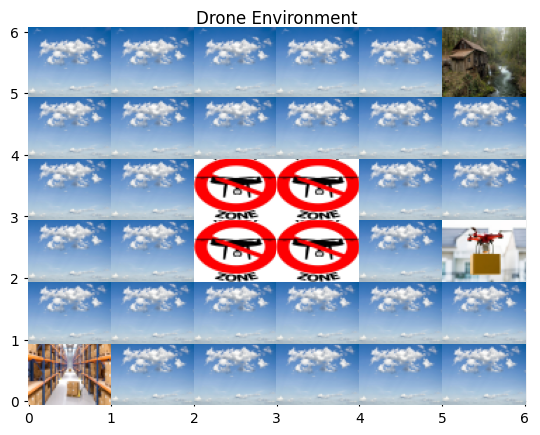


'state': (5, 2, 1),'action': 0, 'reward' : -1


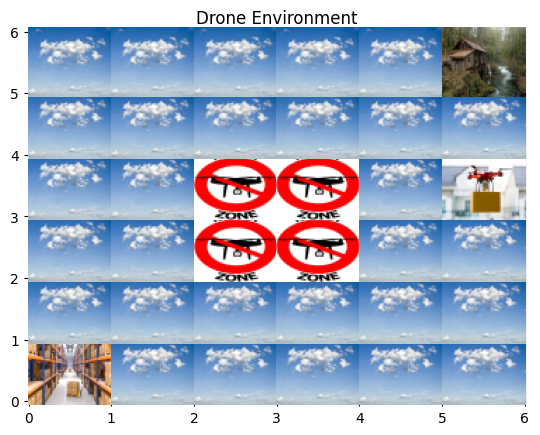


'state': (5, 3, 1),'action': 0, 'reward' : -1


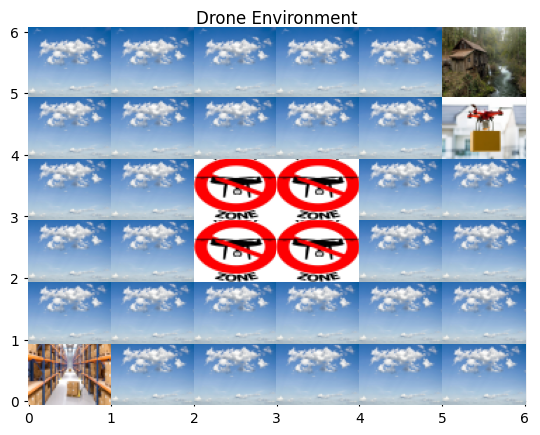


'state': (5, 4, 1),'action': 0, 'reward' : -1


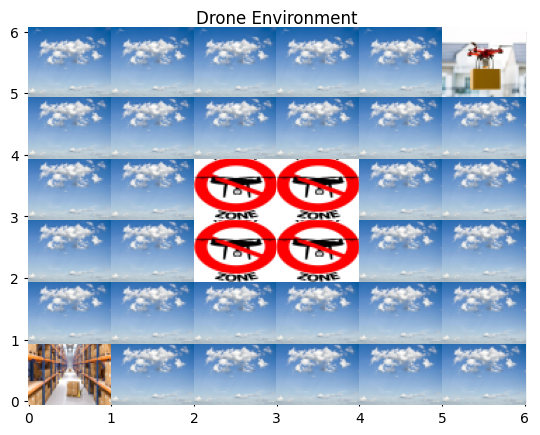


'state': (5, 5, 1),'action': 5, 'reward' : 100


In [65]:
env = AutoDronestoc()
print("\nFirst base model without tuning the parameters")
agent1 = AgentQlearn(env)
print("Initial Qtable:")
print(agent1.qTable)
rewards, epsilons = agent1.train()
plot_train(rewards, epsilons, "Base Model")
print("\nQTable after training:")
print(agent1.qTable)

test_rewards, _ = agent1.test(eps=10)
plot_test(test_rewards, "Base Model")

_, episode_renders = agent1.test(eps=1, render=True)


Training final model with best parameters


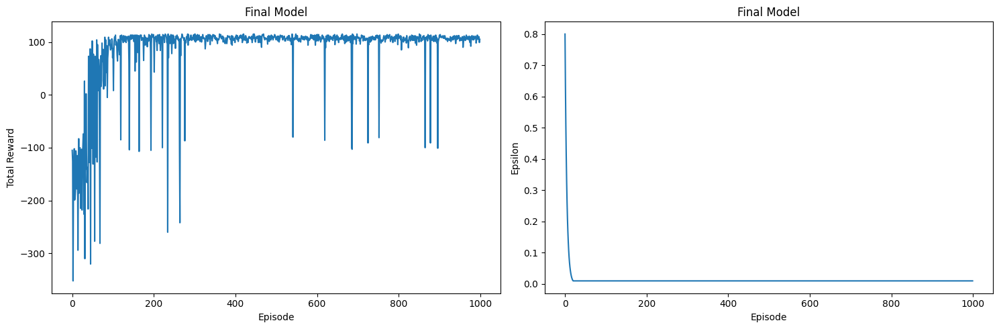

'state': (1, 2, 0),'action': 2, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (1, 2, 0),'action': 2, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 0, 'reward' : -1
'state': (0, 1, 1),'action': 0, 'reward' : -1
'state': (0, 2, 1),'action': 0, 'reward' : -1
'state': (0, 3, 1),'action': 0, 'reward' : -1
'state': (0, 4, 1),'action': 3, 'reward' : -1
'state': (1, 4, 1),'action': 0, 'reward' : -1
'state': (1, 5, 1),'action': 3, 'reward' : -1
'state': (2, 5, 1),'action': 3, 'reward' : -1
'state': (3, 5, 1),'action': 3, 'reward' : -1
'state': (4, 5, 1),'action': 3, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (4, 1, 0),'action': 1, 'reward' : -1
'state': (4, 0, 0),'action': 2, 'reward' : -1
'state': (3, 0, 0),'action': 2, 'reward' : -1
'state': (2, 0, 0),'action': 2, 'reward' : -1
'state': (1, 0, 0),'action': 2, '

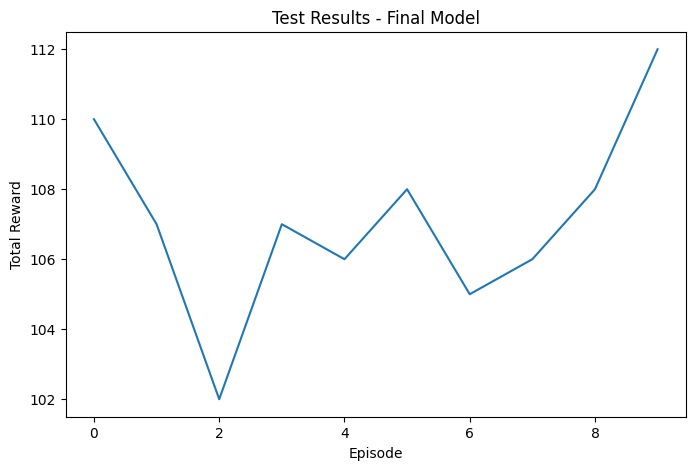

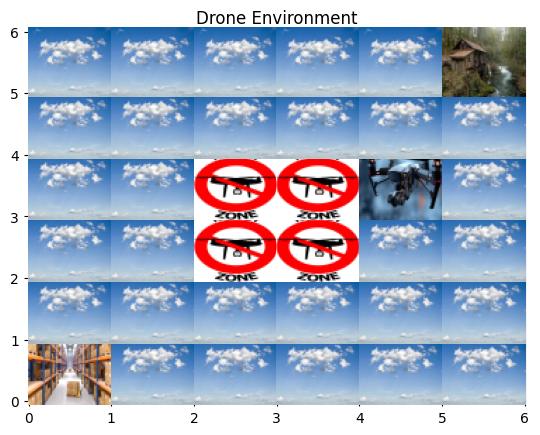


'state': (4, 3, 0),'action': 1, 'reward' : -1


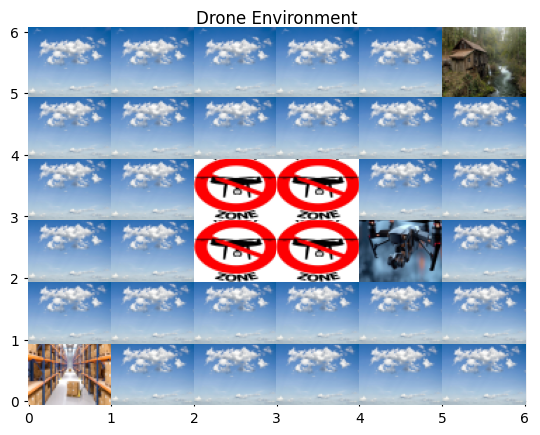


'state': (4, 2, 0),'action': 3, 'reward' : -1


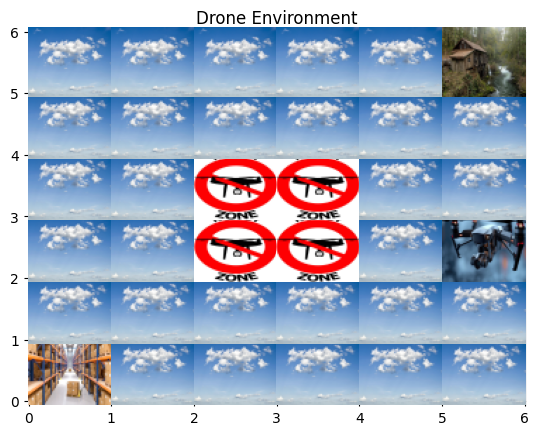


'state': (5, 2, 0),'action': 1, 'reward' : -1


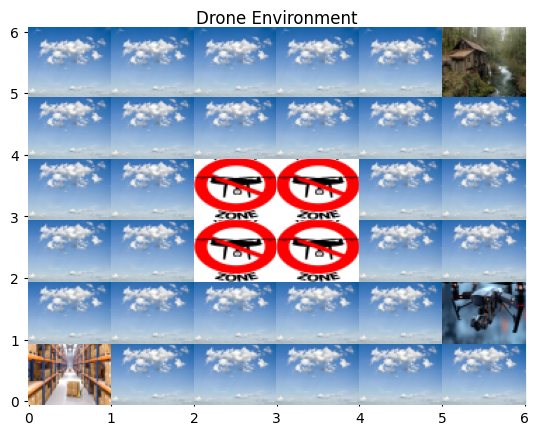


'state': (5, 1, 0),'action': 2, 'reward' : -1


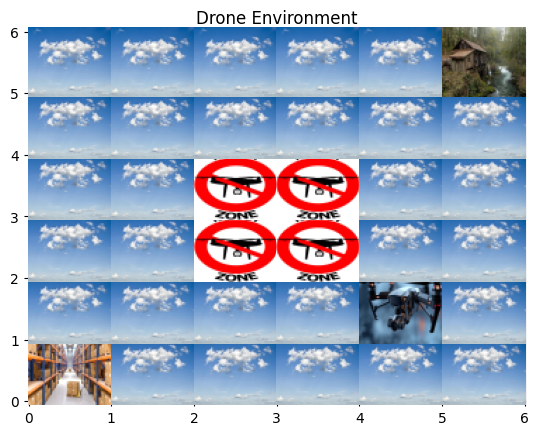


'state': (4, 1, 0),'action': 1, 'reward' : -1


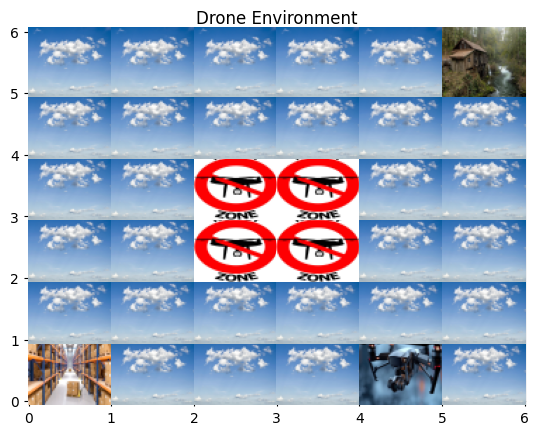


'state': (4, 0, 0),'action': 2, 'reward' : -1


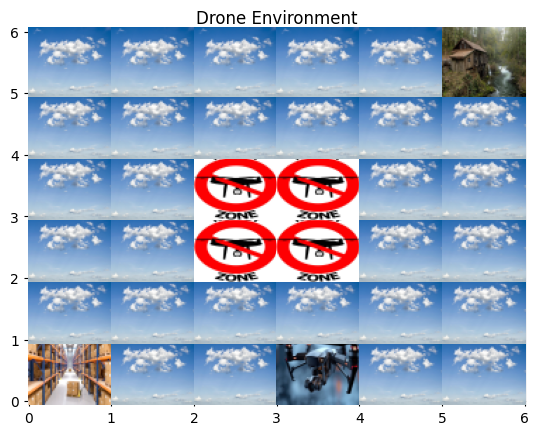


'state': (3, 0, 0),'action': 2, 'reward' : -1


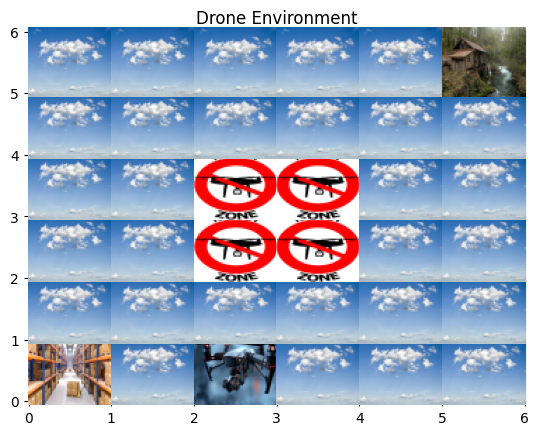


'state': (2, 0, 0),'action': 2, 'reward' : -1


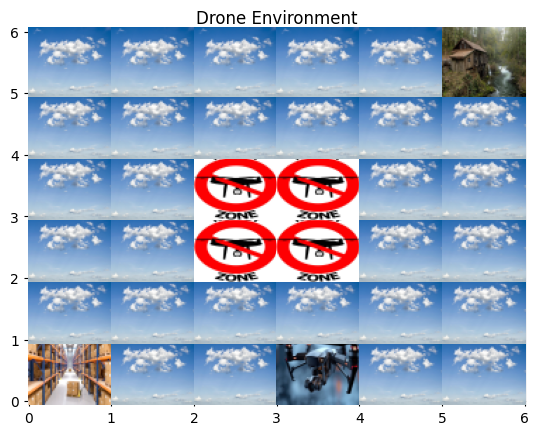


'state': (3, 0, 0),'action': 2, 'reward' : -1


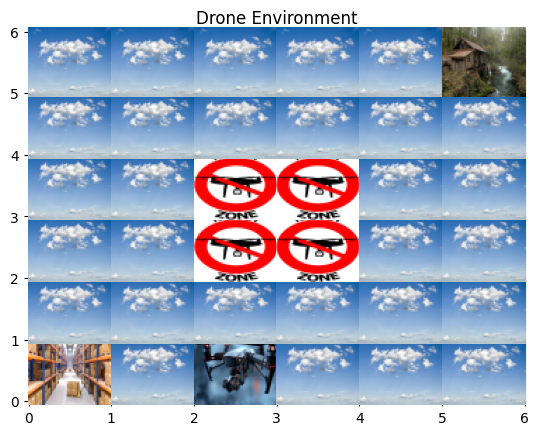


'state': (2, 0, 0),'action': 2, 'reward' : -1


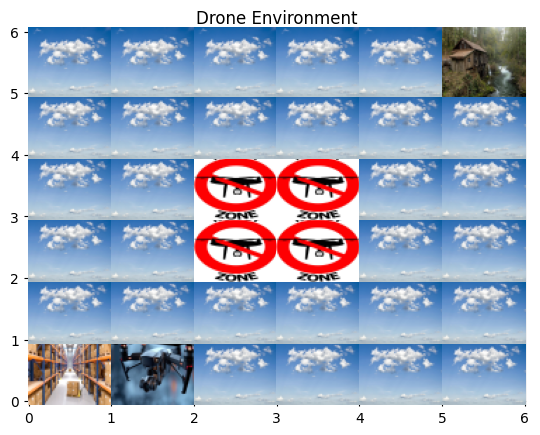


'state': (1, 0, 0),'action': 2, 'reward' : -1


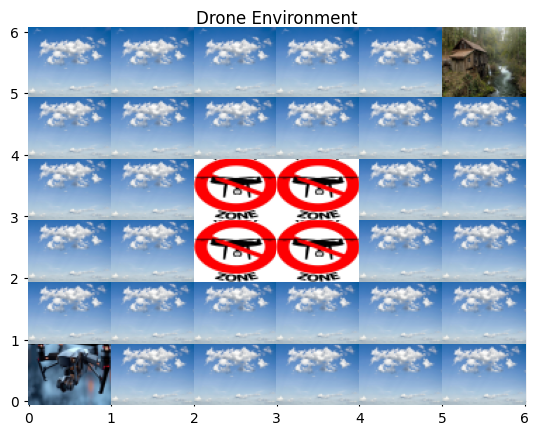


'state': (0, 0, 0),'action': 4, 'reward' : 25


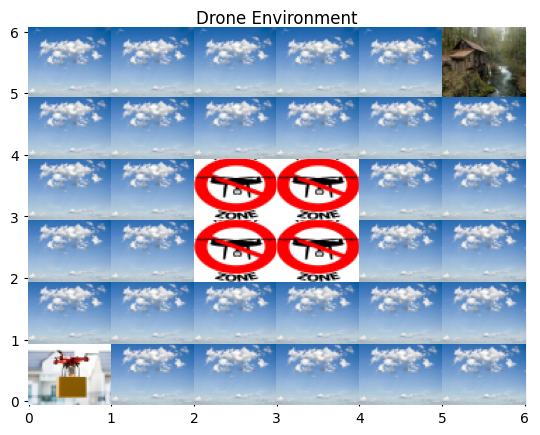


'state': (0, 0, 1),'action': 0, 'reward' : -1


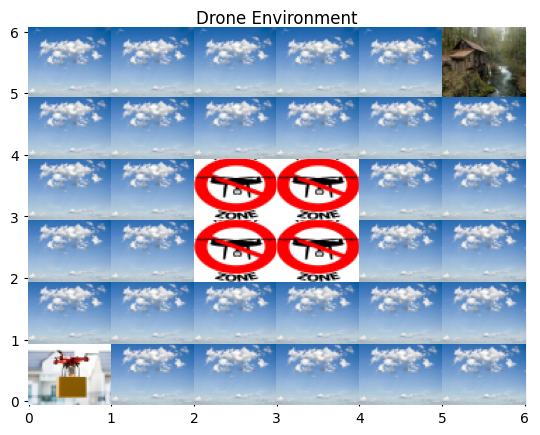


'state': (0, 0, 1),'action': 0, 'reward' : -1


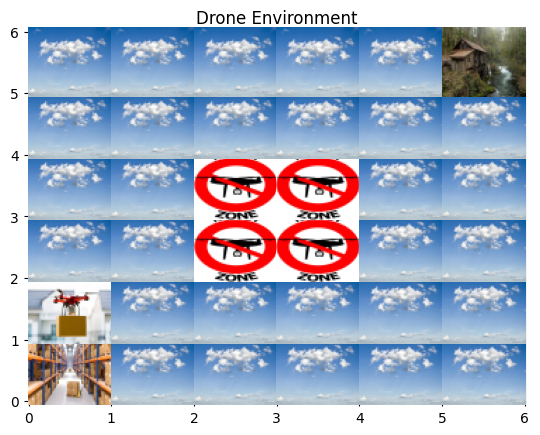


'state': (0, 1, 1),'action': 0, 'reward' : -1


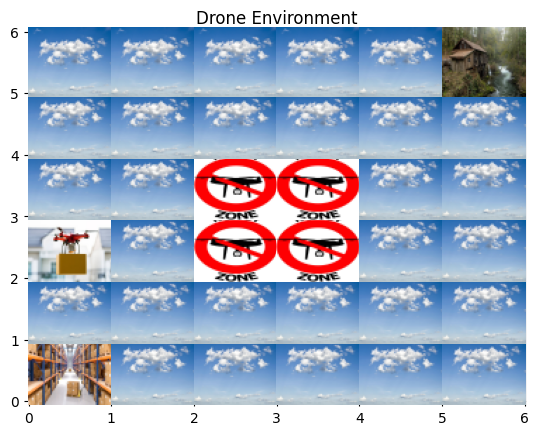


'state': (0, 2, 1),'action': 0, 'reward' : -1


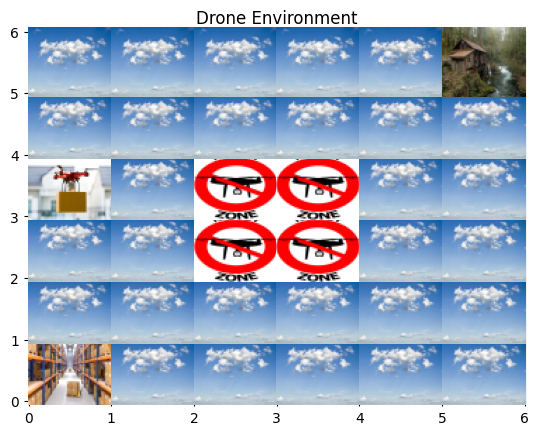


'state': (0, 3, 1),'action': 0, 'reward' : -1


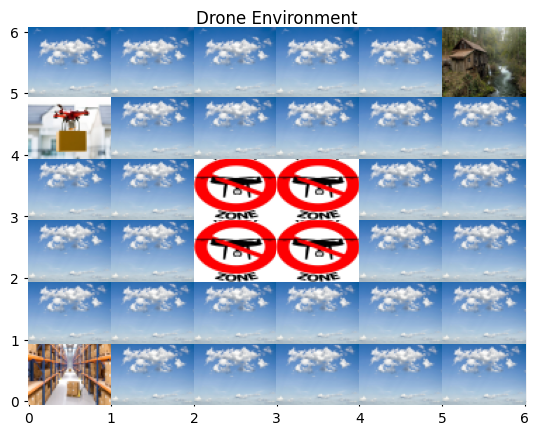


'state': (0, 4, 1),'action': 3, 'reward' : -1


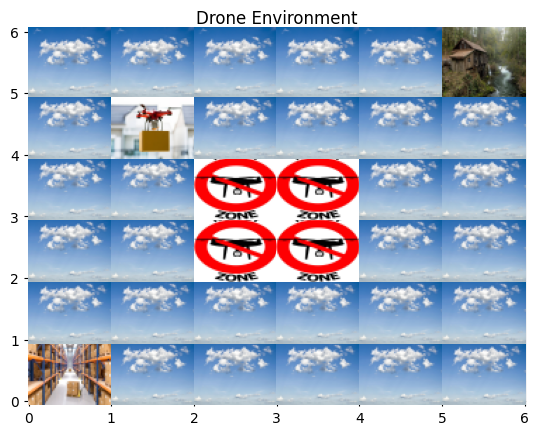


'state': (1, 4, 1),'action': 0, 'reward' : -1


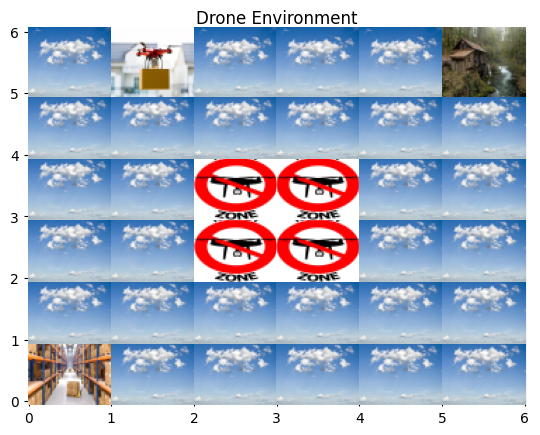


'state': (1, 5, 1),'action': 3, 'reward' : -1


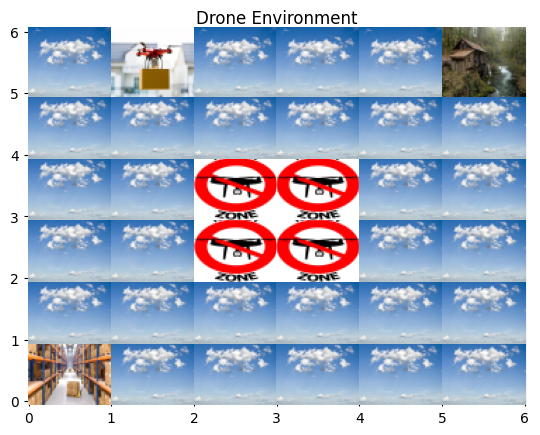


'state': (1, 5, 1),'action': 3, 'reward' : -1


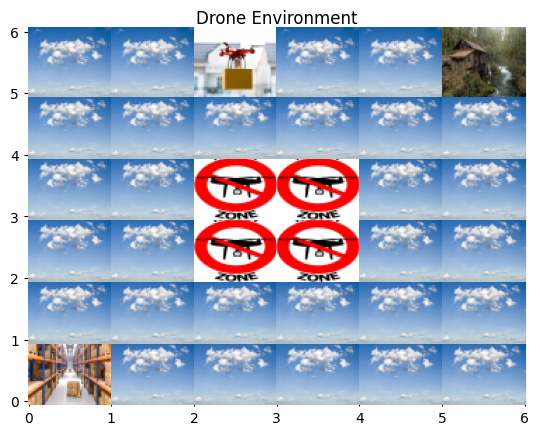


'state': (2, 5, 1),'action': 3, 'reward' : -1


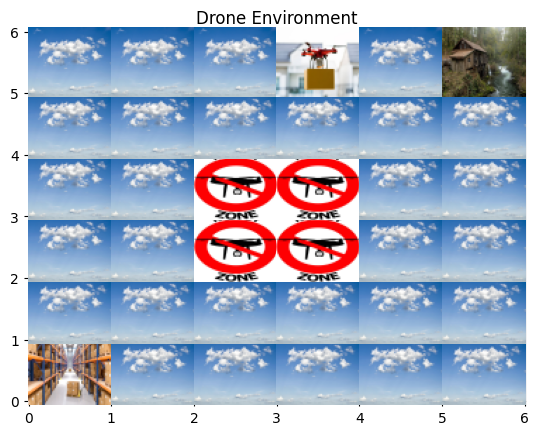


'state': (3, 5, 1),'action': 3, 'reward' : -1


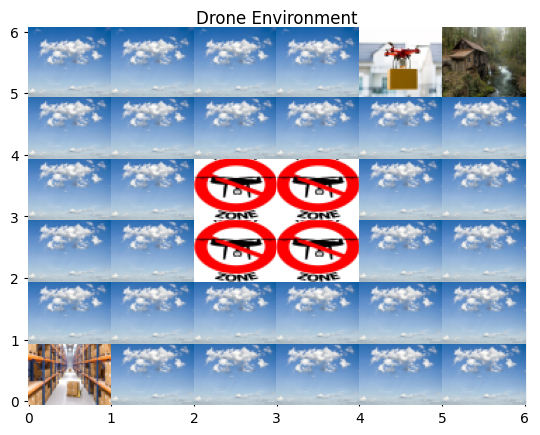


'state': (4, 5, 1),'action': 3, 'reward' : -1


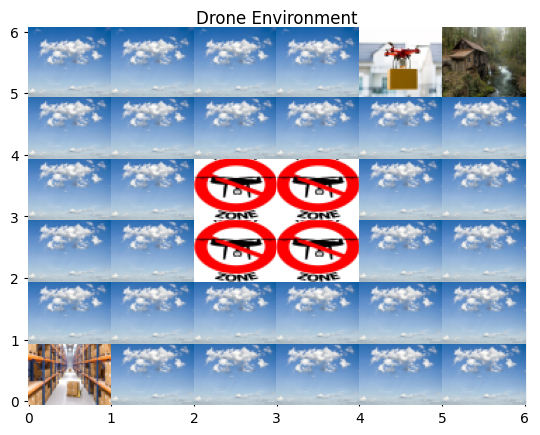


'state': (4, 5, 1),'action': 3, 'reward' : -1


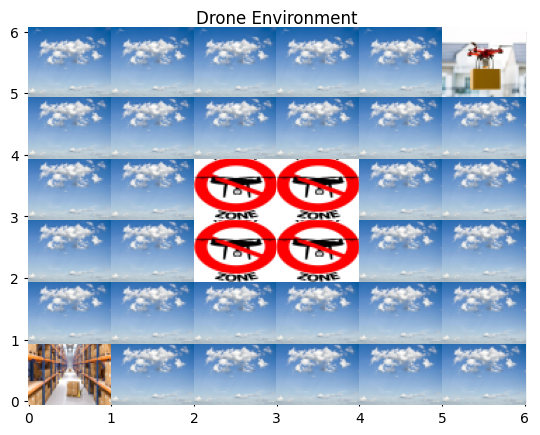


'state': (5, 5, 1),'action': 5, 'reward' : 100

Final model performance summary:
Average evaluation reward: 107.10
Standard deviation: 2.59
Best episode reward: 112.00
Worst episode reward: 102.00


In [74]:
print("\nTraining final model with best parameters")
final_stocagent = AgentQlearn(env, discount=0.9, epsilon_decay=0.8)
final_rewards_stoc_qlearn, final_epsilons = final_stocagent.train()

with open('best_qtable_stochastic.pkl', 'wb') as f:
    pickle.dump(final_stocagent.qTable, f)

plot_train(final_rewards_stoc_qlearn, final_epsilons, "Final Model")
final_test_rewards, final_renders = final_stocagent.test(eps=10)
plot_test(final_test_rewards, "Final Model")
_, episode_renders = final_stocagent.test(eps=1, render=True)

print("\nFinal model performance summary:")
print(f"Average evaluation reward: {np.mean(final_test_rewards):.2f}")
print(f"Standard deviation: {np.std(final_test_rewards):.2f}")
print(f"Best episode reward: {max(final_test_rewards):.2f}")
print(f"Worst episode reward: {min(final_test_rewards):.2f}")

In [67]:
#SARSA

In [78]:
class SARSAAgent:
    def __init__(self, env, lr=0.1, discount=0.9, epsilon=1.0, epsilon_decay=0.8, epsilon_min=0.01):
        self.env = env
        self.lr = lr
        self.discount = discount
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min
        self.qTable = {}
        self.initialTable = None
    
    def action_selection(self, state, training=True):
        if state not in self.qTable:
            self.qTable[state] = np.zeros(self.env.action_space.n)
        
        if training and random.random() < self.epsilon:
            return self.env.action_space.sample()                        #providing a random action for exploration
        return np.argmax(self.qTable[state])                            # greedy way of selecting maximum q value action
    
    def train(self, eps=1000, max_steps=100):
        self.initialTable = self.qTable.copy()
        log_reward = []
        log_epsilon = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0   
            # Get first action using epsilon-greedy
            action = self.action_selection(state)
            
            for step in range(max_steps):
                # Take action and observe next state and reward
                next_state, reward, ep_end, _, _ = self.env.step(action)
                
                # Initialize Q-value for next state if needed
                if next_state not in self.qTable:
                    self.qTable[next_state] = np.zeros(self.env.action_space.n)
                next_action = self.action_selection(next_state)                                    #key line in SARSA, We actually use the q value of next action that is taken instead of simply using next action that gives max q value
                old_val = self.qTable[state][action]
                next_val = self.qTable[next_state][next_action]  # Use actual next action instead of max which is the diff from q learing formula if you compare with SARSA
                new_val = old_val + self.lr * (reward + self.discount * next_val - old_val)
                self.qTable[state][action] = new_val
                state = next_state
                action = next_action
                total_reward += reward  
                if ep_end:
                    break
            
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            log_reward.append(total_reward)
            log_epsilon.append(self.epsilon)
            
        return log_reward, log_epsilon
    
    def test(self, eps=10, render=False):
        test_reward = []
        ep_info = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0
            episode_states = []  
            while True:
                action = self.action_selection(state, training=False)
                if render:
                    episode_states.append({'state': state,'action': action,'grid': self.env.render()})
                
                next_state, reward, ep_end, _, _ = self.env.step(action)
                print(f"'state': {state},'action': {action}, 'reward' : {reward}")
                total_reward += reward
                state = next_state
                
                if ep_end:
                    break
            
            test_reward.append(total_reward)
            if render:
                ep_info.append(episode_states)
        
        return test_reward, ep_info


Initial Qtable:
{}

Trained Qtable:
{(0, 5, 0): array([-0.3872752 , 18.34532595, -1.50723562, -1.44468081, -1.9171    ,
       -1.933219  ]), (1, 5, 0): array([-2.00370061, 14.54368117, -1.8480253 , -0.96696953, -3.70939358,
       -1.909     ]), (1, 4, 0): array([-1.33478461, -1.0890719 , 17.18413934, -0.59936857, -2.14665731,
       -3.15878348]), (2, 5, 0): array([-2.91891127, -2.81997722, 12.35987483, -2.88689188, -2.88214125,
       -3.76223619]), (2, 4, 0): array([-14.14196251, -19.9       ,  13.08333145, -14.20015501,
       -11.98062263, -10.93631682]), (3, 4, 0): array([  0.15614541, -19.9       , -15.11325451, -13.83022857,
       -13.46445207, -14.67849866]), (3, 5, 0): array([-3.37107861, -3.52343704,  9.97633314, -3.33026228, -4.58285526,
       -4.66738203]), (0, 4, 0): array([-1.02258065, 22.39157202, -0.96381806,  0.40949516, -1.5227003 ,
       -1.        ]), (1, 3, 0): array([ -0.8423846 ,  -2.71223787,  18.56765629, -10.        ,
        -1.9       ,  -1.909     ]),

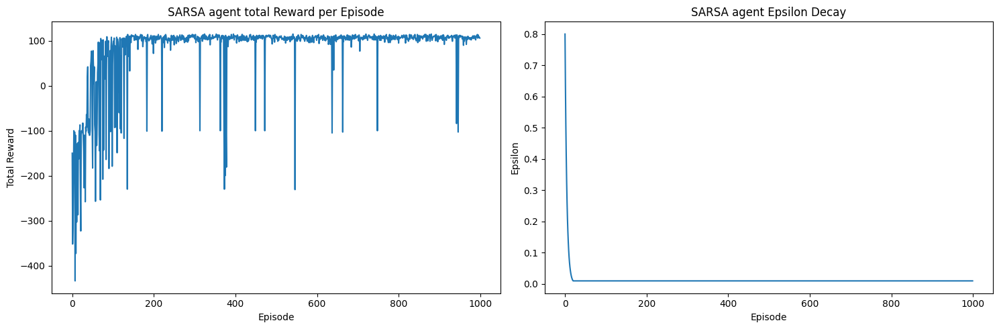

'state': (0, 4, 0),'action': 1, 'reward' : -1
'state': (0, 3, 0),'action': 1, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 0, 'reward' : -1
'state': (1, 0, 1),'action': 0, 'reward' : -1
'state': (1, 1, 1),'action': 2, 'reward' : -1
'state': (0, 1, 1),'action': 0, 'reward' : -1
'state': (0, 2, 1),'action': 0, 'reward' : -1
'state': (0, 3, 1),'action': 0, 'reward' : -1
'state': (0, 4, 1),'action': 0, 'reward' : -1
'state': (0, 5, 1),'action': 3, 'reward' : -1
'state': (1, 5, 1),'action': 3, 'reward' : -1
'state': (2, 5, 1),'action': 3, 'reward' : -1
'state': (3, 5, 1),'action': 3, 'reward' : -1
'state': (4, 5, 1),'action': 3, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (5, 1, 0),'action': 2, 'reward' : -1
'state': (4, 1, 0),'action': 1, 'reward' : -1
'state': (4, 0, 0),'action': 2, 'reward' : -1
'state': (3, 0, 0),'action': 2, '

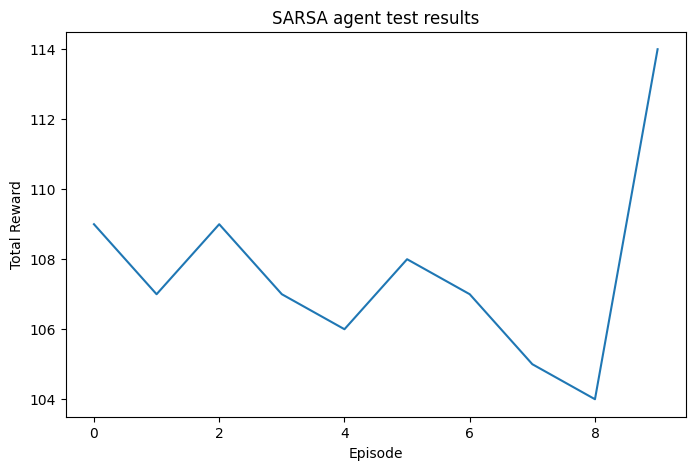

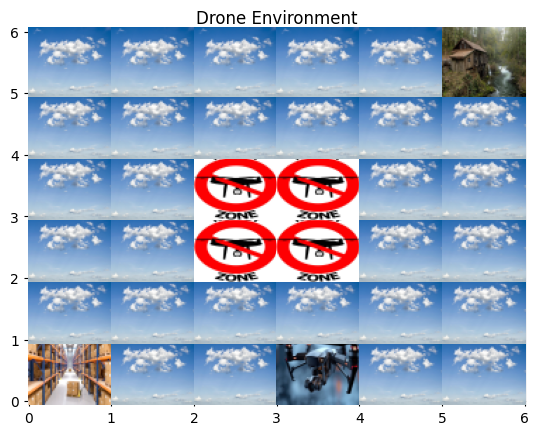

'state': (3, 0, 0),'action': 2, 'reward' : -1


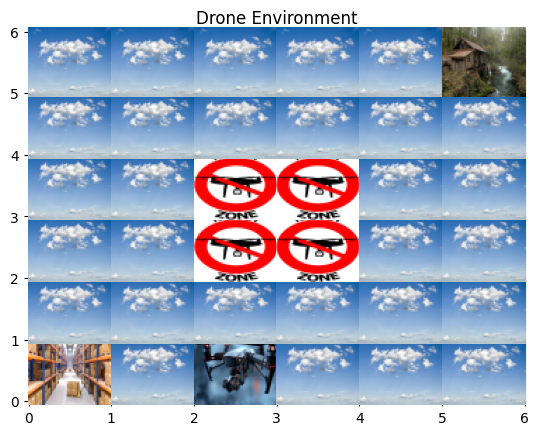

'state': (2, 0, 0),'action': 2, 'reward' : -1


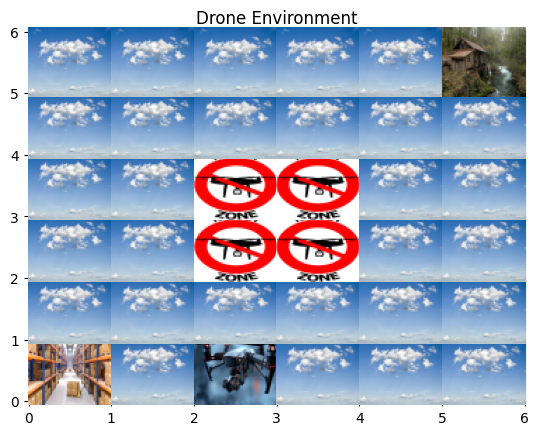

'state': (2, 0, 0),'action': 2, 'reward' : -1


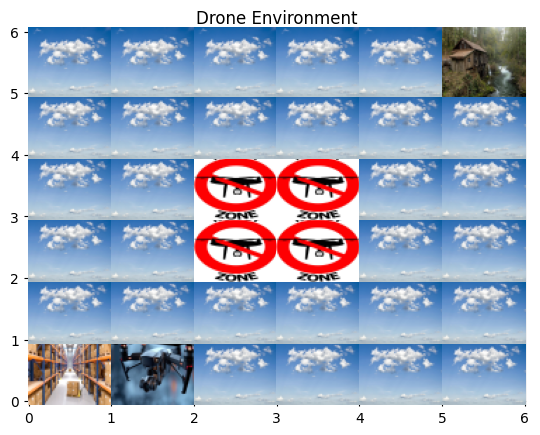

'state': (1, 0, 0),'action': 2, 'reward' : -1


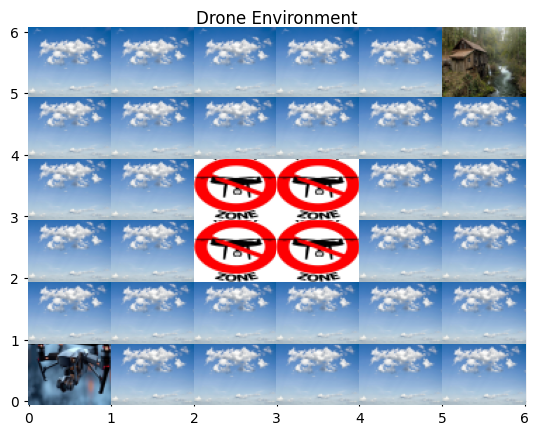

'state': (0, 0, 0),'action': 4, 'reward' : 25


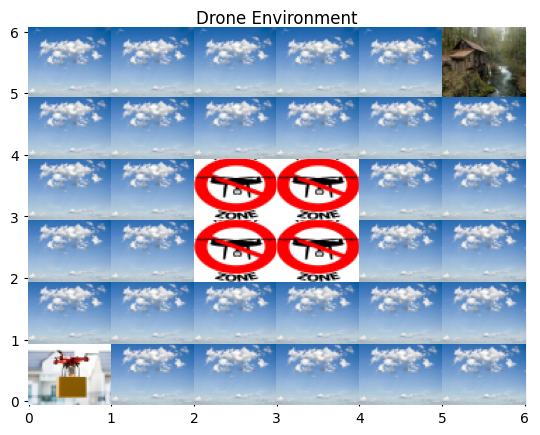

'state': (0, 0, 1),'action': 0, 'reward' : -1


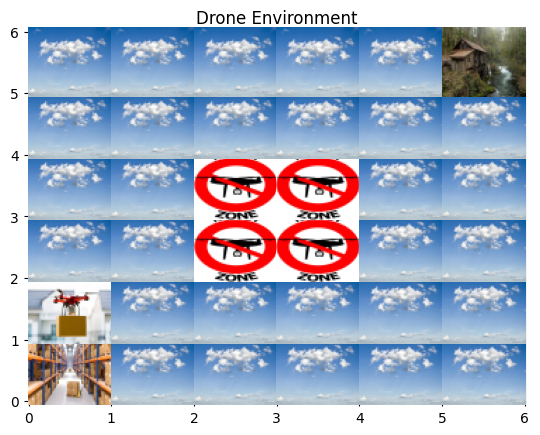

'state': (0, 1, 1),'action': 0, 'reward' : -1


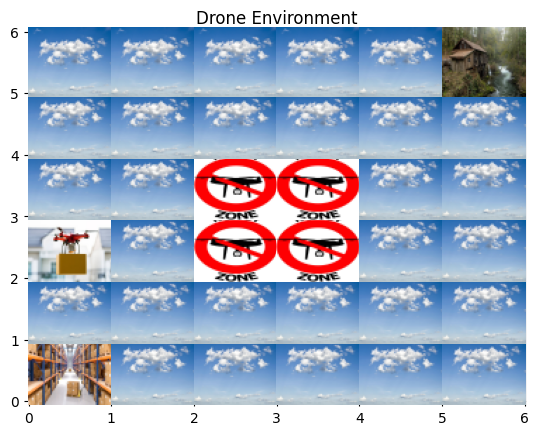

'state': (0, 2, 1),'action': 0, 'reward' : -1


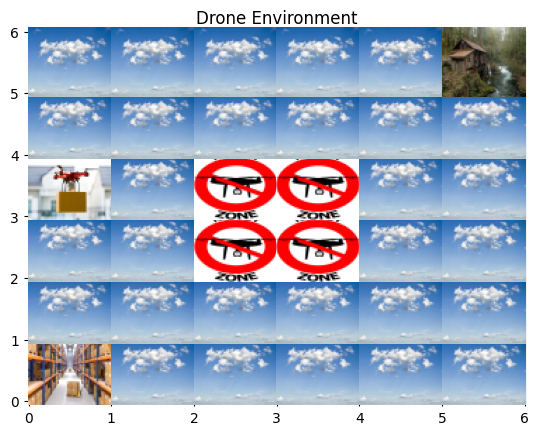

'state': (0, 3, 1),'action': 0, 'reward' : -1


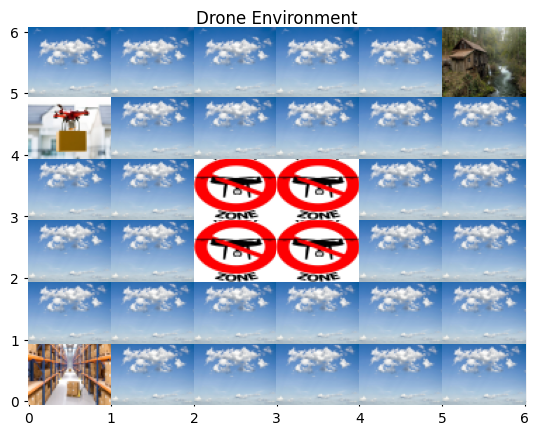

'state': (0, 4, 1),'action': 0, 'reward' : -1


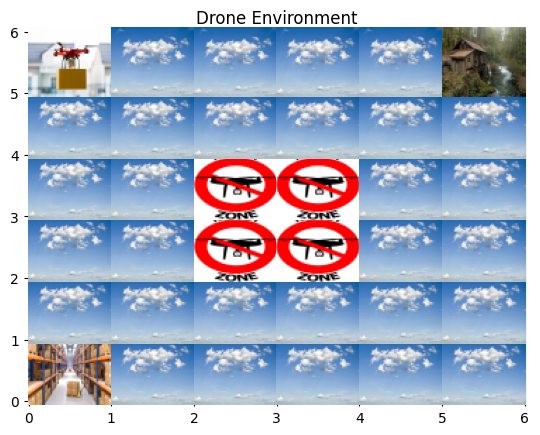

'state': (0, 5, 1),'action': 3, 'reward' : -1


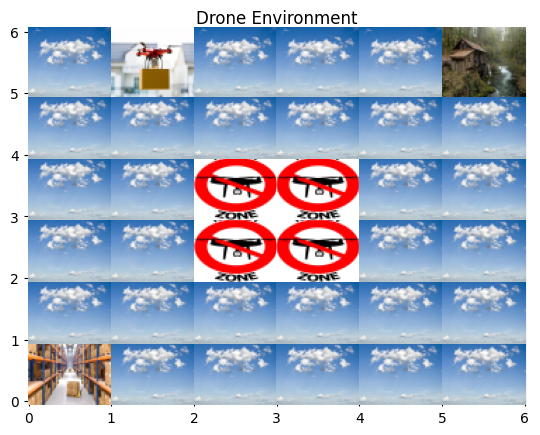

'state': (1, 5, 1),'action': 3, 'reward' : -1


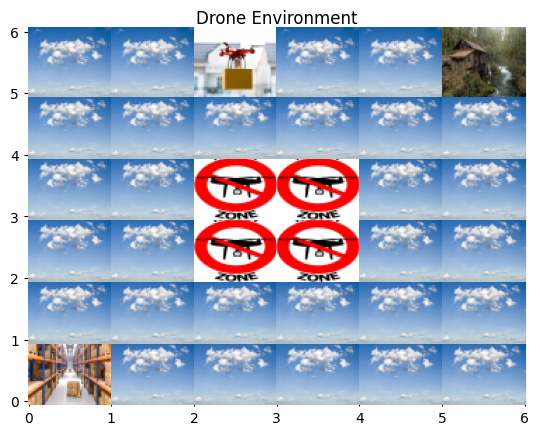

'state': (2, 5, 1),'action': 3, 'reward' : -1


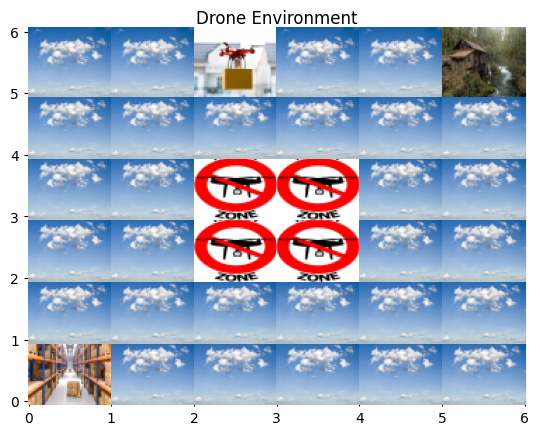

'state': (2, 5, 1),'action': 3, 'reward' : -1


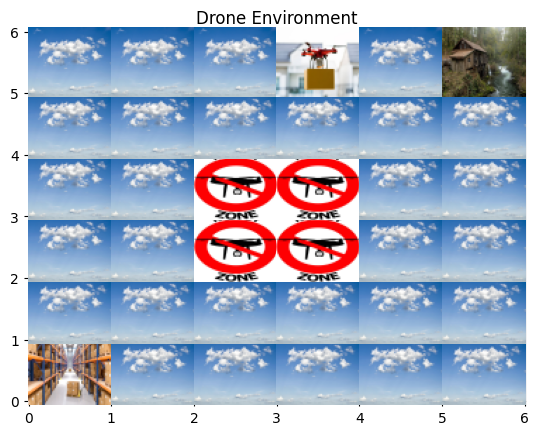

'state': (3, 5, 1),'action': 3, 'reward' : -1


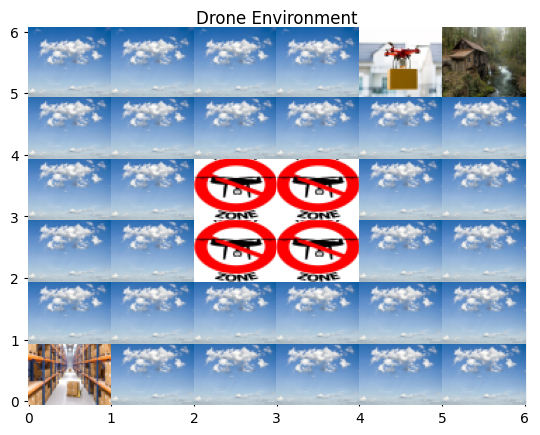

'state': (4, 5, 1),'action': 3, 'reward' : -1


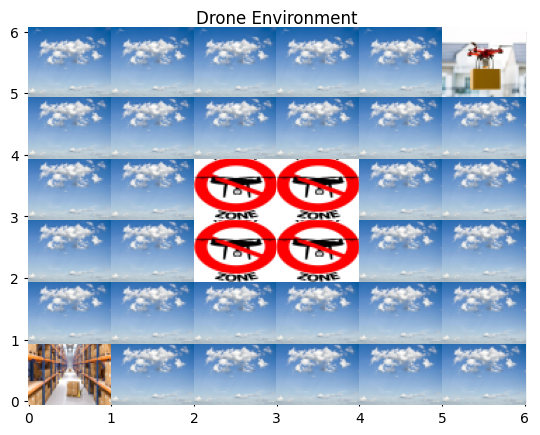

'state': (5, 5, 1),'action': 5, 'reward' : 100

SARSA agent performance summary:
Average evaluation reward is: 107.60
Standard deviation is: 2.62


In [79]:
env = AutoDronestoc()
sarsa_agent = SARSAAgent(env)
print("\nInitial Qtable:")
print(sarsa_agent.qTable)
rewards_stoc_SARSA, epsilons = sarsa_agent.train()
print("\nTrained Qtable:")
print(sarsa_agent.qTable)
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(rewards_stoc_SARSA)
plt.title('SARSA agent total Reward per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')

plt.subplot(1, 2, 2)
plt.plot(epsilons)
plt.title('SARSA agent Epsilon Decay')
plt.xlabel('Episode')
plt.ylabel('Epsilon')

plt.tight_layout()
plt.savefig('sarsa_training_results.png')
plt.show()

test_rewards, _ = sarsa_agent.test(eps=10)

plt.figure(figsize=(8, 5))
plt.plot(test_rewards)
plt.title('SARSA agent test results')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.savefig('sarsa_test_results.png')
plt.show()

_, ep_info = sarsa_agent.test(eps=1, render=True)   

with open('sarsa_qtable_stochastic.pkl', 'wb') as f:
    pickle.dump(sarsa_agent.qTable, f)

print("\nSARSA agent performance summary:")
print(f"Average evaluation reward is: {np.mean(test_rewards):.2f}")
print(f"Standard deviation is: {np.std(test_rewards):.2f}")

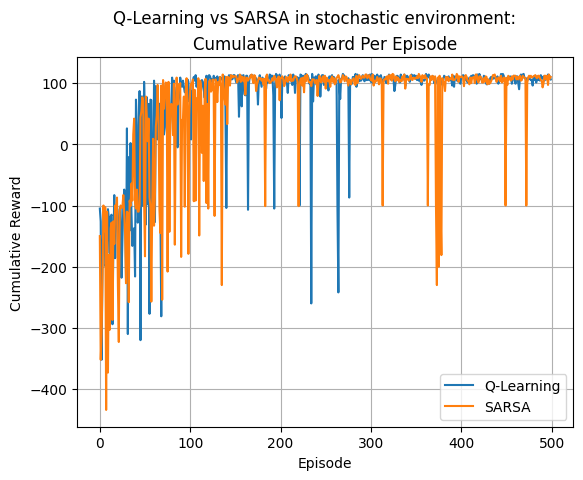

In [80]:
plt.figure()
plt.suptitle(f'Q-Learning vs SARSA in stochastic environment: ')
x = range(500)
plt.plot(x,final_rewards_stoc_qlearn[:500],label='Q-Learning')
plt.plot(x,rewards_stoc_SARSA[:500], label='SARSA')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.title('Cumulative Reward Per Episode')
plt.grid()
plt.legend()